# PyGMT: Different colormaps for land and water


With Python and PyGMT it is quite easy to draw a simple map with elevation of mountains and bathymetry of oceans. However, the simplest approach relies on a colormap colouring everything below 0 m mean sea level in shades of blue, everything above 0 m in shades of green/brown (e.g. with cmap=”geo”). With a world map or in the mountains the result looks pretty good, but with coastlines on detailed maps there are problems. A map of Holland clearly shows the problem:

In [17]:
import pygmt

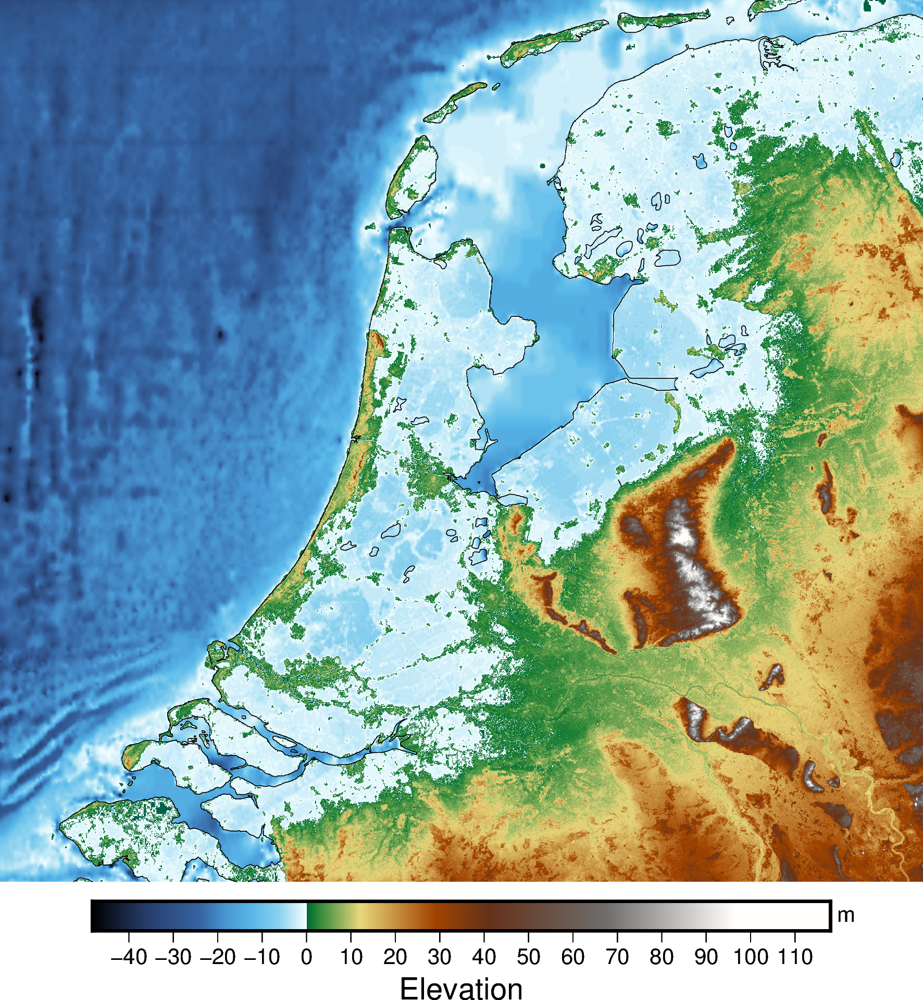

In [18]:
region=[3.2, 6.8, 51.4, 53.5]
grid = pygmt.datasets.load_earth_relief(resolution="03s", region=region)
fig = pygmt.Figure()
fig.grdimage(grid=grid, projection="M15c", cmap="geo")
fig.colorbar(frame=["a10", "x+lElevation", "y+lm"])
fig.coast(shorelines=True, region=region, resolution="f")
fig.show()

The solution is to use a mask for dry and wet areas. We can generate one, corresponding to the coastline in fig.coast().  As “spacing” for the mask I use the value of the “resolution” of the dataset and “resolution” of the mask is “f”, i.e. full resolution as in fig.coast().

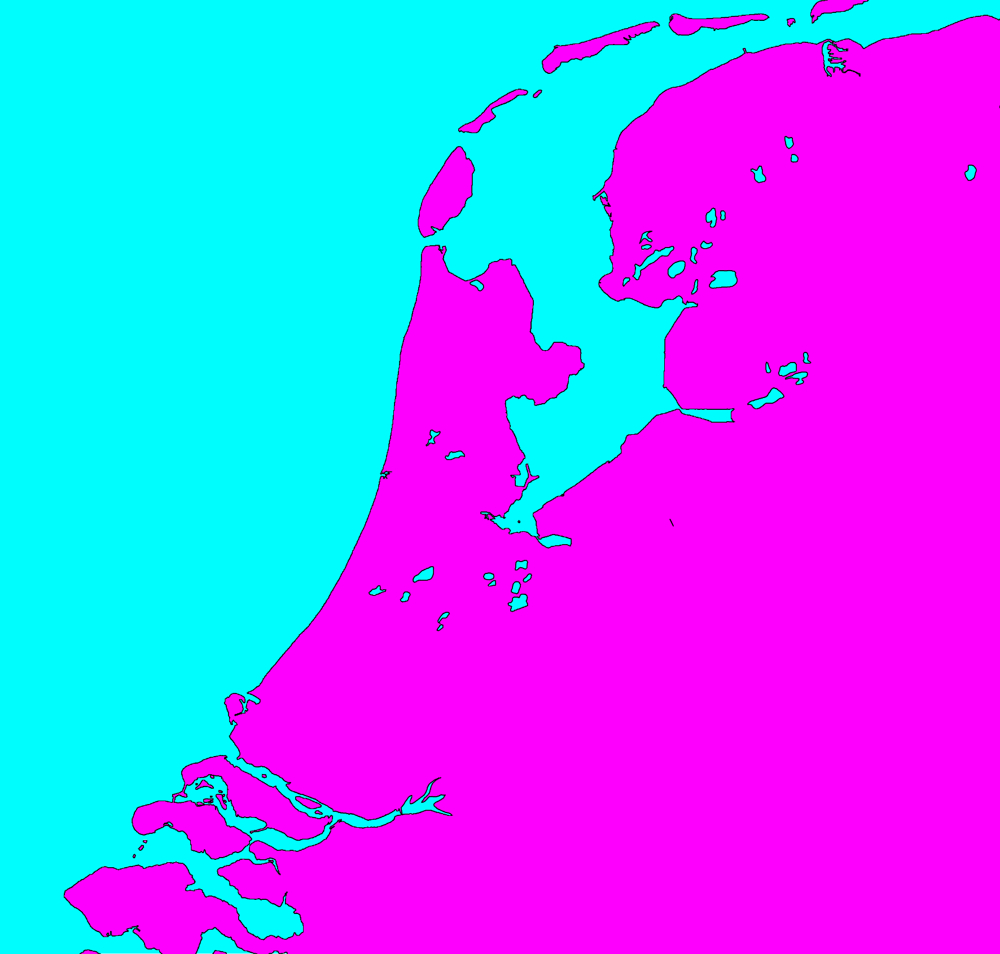

In [19]:
mask = pygmt.grdlandmask(region=region, spacing="03s", maskvalues=[0, 1], resolution="f")

fig = pygmt.Figure()
fig.grdimage(grid=mask, projection="M15c", cmap="cool", shading=True)
fig.coast(shorelines=True,region=region, resolution="f")

fig.show()

With pygmt 0.9 and later, it is possible to download a mask grid for some resolutions with pygmt.datasets.load_earth_mask() instead of calculating it with pygmt.grdlandmask(). In this case, mask is an xarray with 0 for ocean, 1 for land, 2 for lakes, 3 islands, 4 ponds.

In [20]:
# from pygmt.datasets import load_earth_mask
# mask = load_earth_mask(resolution="15s", region=region)

# Because of rounding errors, the lat lon of the mask grid might be slightly offset
# In this case reindex the mask:

# mask =  mask.where(mask == 1).reindex_like(grid, method='nearest', tolerance=0.01)

The first trick is that the mask can simply be multiplied by the grid, then all water pixels are set to 0. Now we can draw the land with a suitable colormap, e.g. cmap=”dem1″.

We plot the water over the result in the second step. However, we cannot simply use “maskvalues=[1, 0]” now, because then the land becomes shallow water of 0 m depth. Fortunately, it is possible to specify “NaN” (as a string) as a value in the mask. 

In [21]:
# pygmt.grdlandmask(region=region, spacing="03s", maskvalues=[1, "NaN"], resolution="f")

But I don't want to recalculate the mask. We can also use xarrays `.where()` method on the mask to turn the values to 1 for land and nan for water and vice versa. 

In fig.grdimage() we can ensure with “nan_transparent=True” that the land is now transparent.

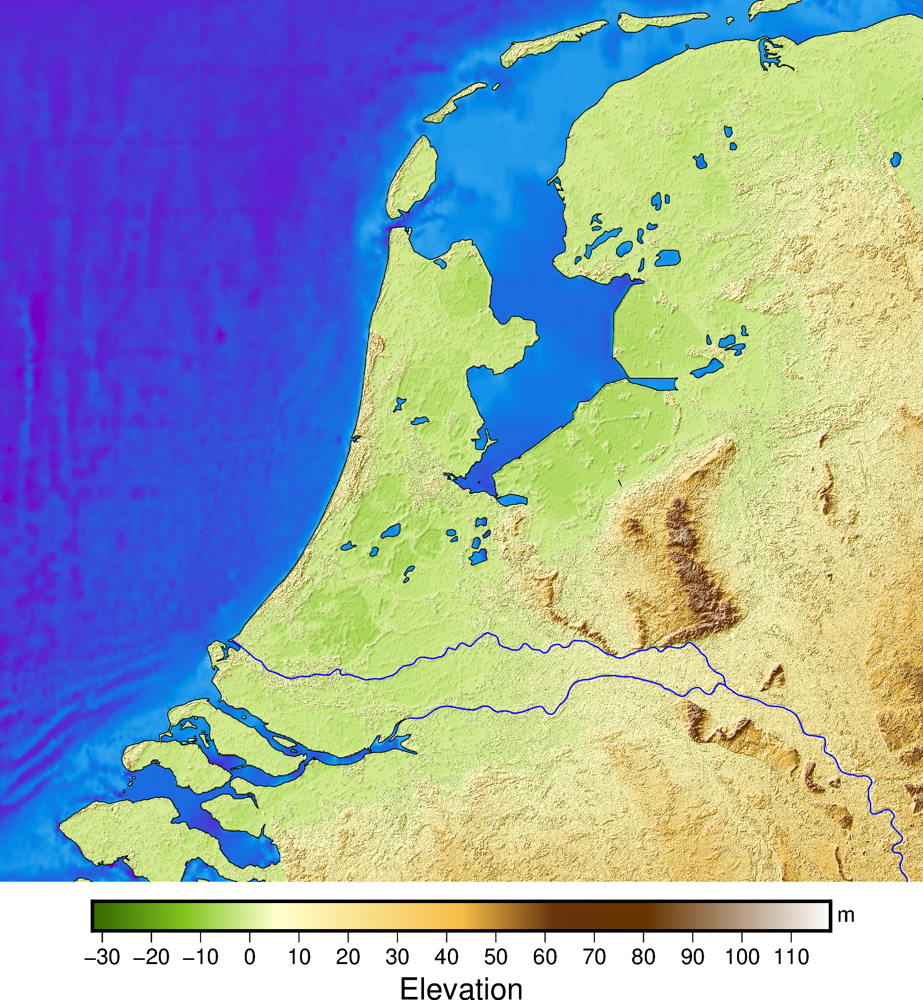

In [22]:
land = grid * mask.where(mask==1)
wet = grid * (mask.where(mask==0) + 1)

fig = pygmt.Figure()
fig.grdimage(grid=land, projection="M15c", cmap="dem1", shading=True)
fig.colorbar(frame=["a10", "x+lElevation", "y+lm"])
fig.grdimage(grid=wet, cmap="seafloor", nan_transparent=True)

fig.coast(shorelines=True, projection="M15c",region=region, resolution="f")
fig.coast(rivers="1/0.5p,blue")

fig.show()

In [23]:
# fig.savefig("holland2.png")